Start by downloading the csv file, preprocessed as [explained in this notebook](https://github.com/64FC/Openclassrooms_DataScientist/blob/main/Projet_2/OpenFoodFacts_1_notebook_nettoyage.ipynb).

In [81]:
# Run then restart kernel (needed for plotly plots displayed on GitHub)
!pip install -U kaleido

In [1]:
# Download the csv file
!wget 'https://raw.githubusercontent.com/64FC/Openclassrooms_DataScientist/main/Projet_2/food_data_reworked.csv'

--2023-09-13 05:54:08--  https://raw.githubusercontent.com/64FC/Openclassrooms_DataScientist/main/Projet_2/food_data_reworked.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 7419986 (7.1M) [text/plain]
Saving to: ‘food_data_reworked.csv.1’

food_data_reworked. 100%[===================>]   7.08M  --.-KB/s    in 0.03s   

2023-09-13 05:54:08 (250 MB/s) - ‘food_data_reworked.csv.1’ saved [7419986/7419986]



In [1]:
# Read the file
import pandas as pd

food_data = pd.read_csv('food_data_reworked.csv', sep='\t', encoding='utf-8')

# Check the content
print("This dataset contains {} rows and {} columns".format(food_data.shape[0],
                                                            food_data.shape[1]))
food_data.head()

This dataset contains 60336 rows and 20 columns


,product_name,energy_kcal_100g,fat_100g,saturated-fat_100g,outlier_sat_fat,carbohydrates_100g,sugars_100g,outlier_sugars,fiber_100g,outlier_fiber,proteins_100g,outlier_proteins,salt_100g,outlier_salt,fruits-vegetables-nuts_100g,fruits-veg-missing,nutriscore,nutrigrade,pnns_1,pnns_2
0,Lion Peanut x2,450.05,20.00,12.5,0.0,70.00,19.56,1.0,2.5,0.0,2.5,0.0,0.10,0.0,0.0,1.0,22.0,e,UNK,UNK
1,Mini Confettis,418.98,27.24,0.8,0.0,19.70,0.03,1.0,0.9,0.0,0.6,0.0,0.01,0.0,0.0,1.0,14.0,d,UNK,UNK
2,Praliné Amande Et Noisette,575.05,45.72,2.9,0.0,22.15,17.51,1.0,3.9,0.0,9.5,0.0,0.00,0.0,0.0,1.0,14.0,d,UNK,UNK
3,"Pepsi, Nouveau goût !",42.30,0.00,0.0,0.0,10.40,10.40,0.0,0.0,0.0,0.0,0.0,0.03,0.0,0.0,1.0,13.0,d,Beverages,Sweetened beverages
4,Tarte Poireaux Et Lardons,257.89,17.42,11.0,0.0,17.30,1.00,0.0,1.4,0.0,7.5,0.0,0.80,0.0,0.0,1.0,15.0,d,UNK,UNK


# Univariate Analysis

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a function to plot the boxplot and the histogram
def plt_box_hist(df, col_):
  # Define the dimensions of the plot (global modification)
  plt.rcParams['figure.figsize'] = (7,3.5)
  # To reset figsize for future plots
  #plt.rcParams['figure.figsize'] = plt.rcParamsDefault['figure.figsize']

  _, axs = plt.subplots(2, 1, gridspec_kw={'height_ratios': (.15, .85)})
  # Boxplot on 1st row
  axs[0] = sns.boxplot(df, x=col_, orient='h', ax=axs[0], showmeans=True,
                       meanprops={'marker':'8',
                                  'markerfacecolor':'red',
                                  'markeredgecolor':'red',
                                  'markersize':'5'})
  # Remove x axis name
  axs[0].set(xlabel='')
  # Histogram on 2nd row
  axs[1] = sns.histplot(df, x=col_, stat='percent', bins=20, kde=True)
  # Add mean, median and standard deviation
  axs[1].text(0.8, 0.9, f'Mean: {df[col_].mean():.2f}', fontsize=9,
              transform=axs[1].transAxes)
  axs[1].text(0.8, 0.83, f'Median: {df[col_].median():.2f}', fontsize=9,
              transform=axs[1].transAxes)
  axs[1].text(0.8, 0.76, f'Std: {df[col_].std():.2f}', fontsize=9,
              transform=axs[1].transAxes)
  # Remove x and y axis names
  axs[1].set(xlabel='', ylabel='')
  plt.show()

## Nutri Score

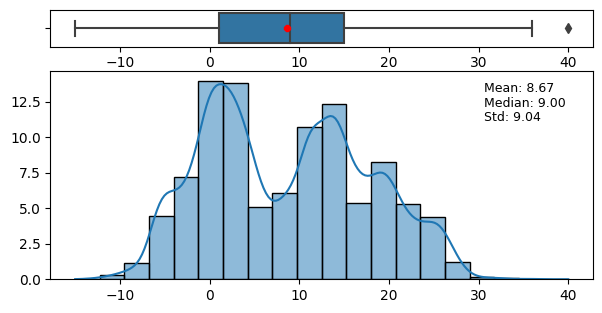

In [3]:
# Plot for the nutri score
col_ = 'nutriscore'

plt_box_hist(food_data, col_)

This does not look like it is normally distributed, but let's confirm it using a QQ-plot.
* If normally distributed, the data (in blue) should follow the diagonal (red).
* If needed, this can be confirmed statistically using either a Shapiro-Wilk test, or a Kolmogorov-Smirnov test.

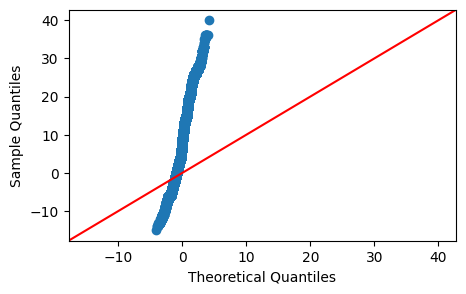

In [4]:
# Check for normality with a QQ-plot
import statsmodels.api as sm

# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

sm.qqplot(food_data[col_], line='45')
plt.show()

## Energy

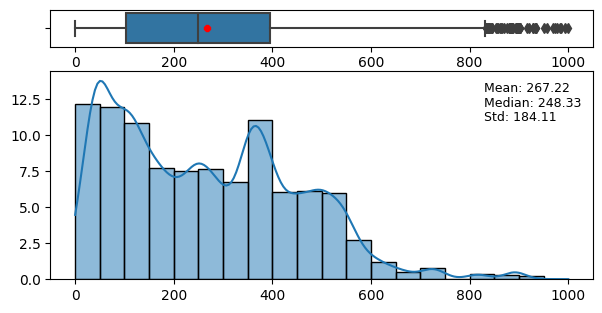

In [5]:
# Plot for the energy
col_ = 'energy_kcal_100g'

plt_box_hist(food_data, col_)

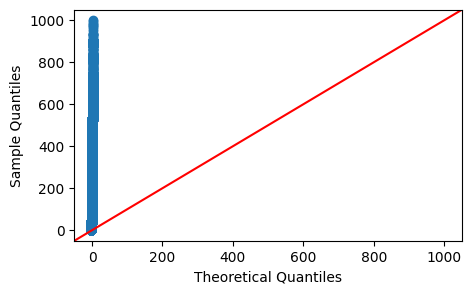

In [6]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

## Fat

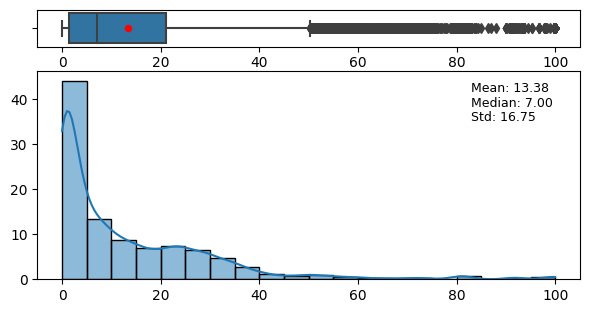

In [7]:
# Plot for the fat
col_ = 'fat_100g'

plt_box_hist(food_data, col_)

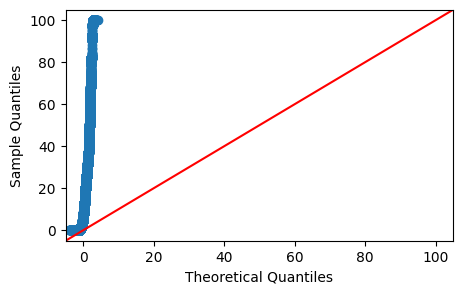

In [8]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

## Saturated fat

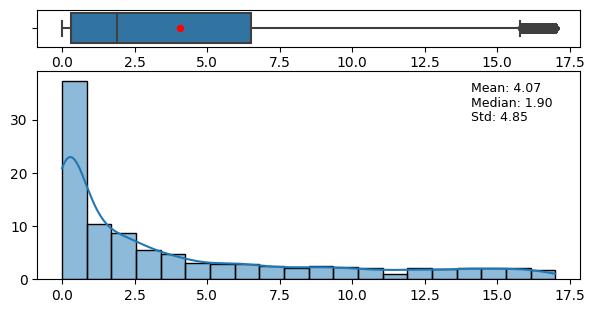

In [9]:
# Plot for the saturated fat
col_ = 'saturated-fat_100g'

plt_box_hist(food_data, col_)

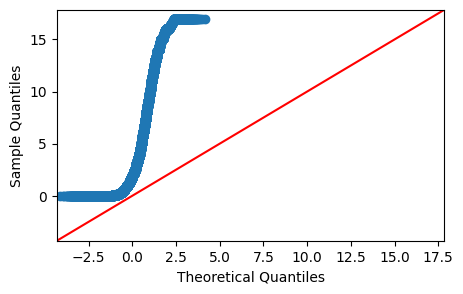

In [10]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

## Carbohydrates

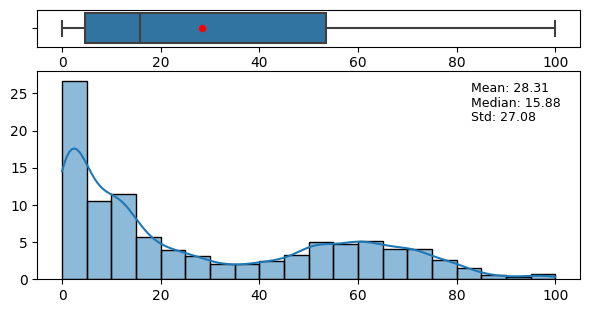

In [11]:
# Plot for the carbohydrates
col_ = 'carbohydrates_100g'

plt_box_hist(food_data, col_)

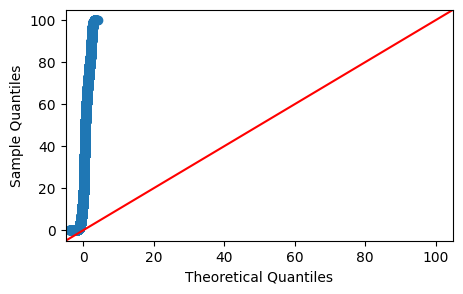

In [12]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

## Sugars

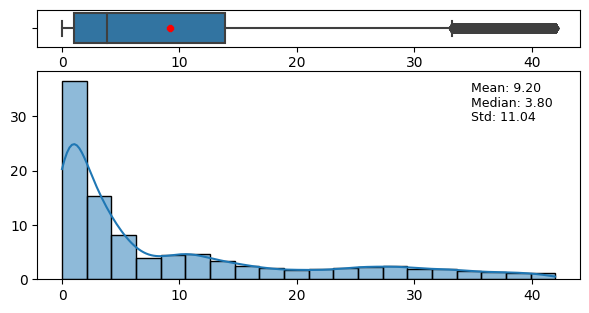

In [13]:
# Plot for the carbohydrates
col_ = 'sugars_100g'

plt_box_hist(food_data, col_)

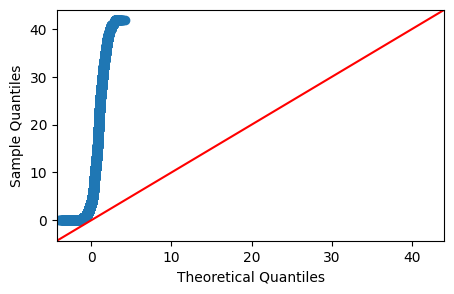

In [14]:
# Define the dimensions of the plot (global modification)
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

## Fiber

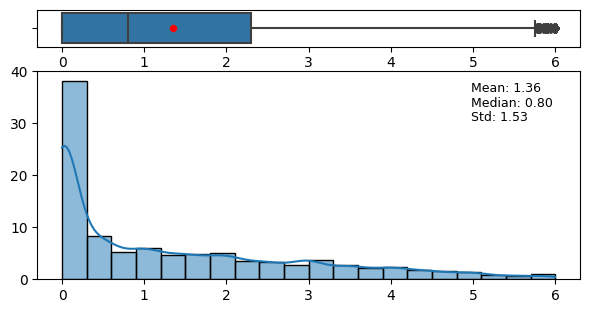

In [15]:
# Plot for the fiber
col_ = 'fiber_100g'

plt_box_hist(food_data, col_)

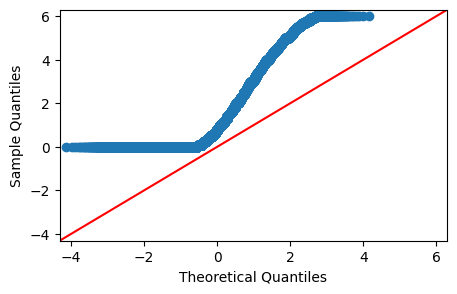

In [16]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

## Proteins

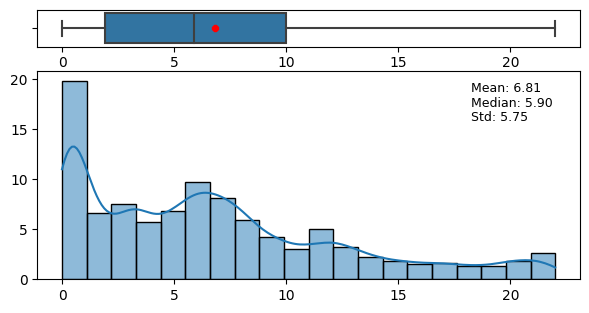

In [17]:
# Plot for the proteins
col_ = 'proteins_100g'

plt_box_hist(food_data, col_)

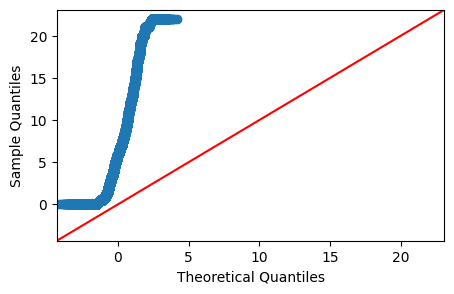

In [18]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

## Salt

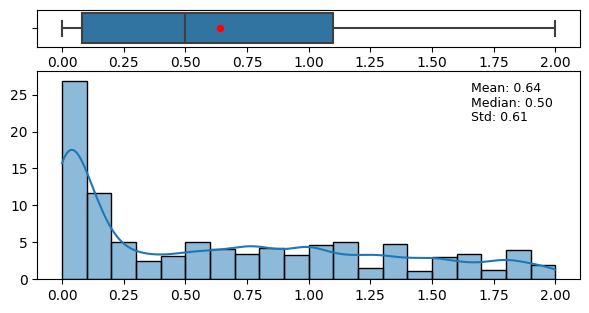

In [19]:
# Plot for the salt
col_ = 'salt_100g'

plt_box_hist(food_data, col_)

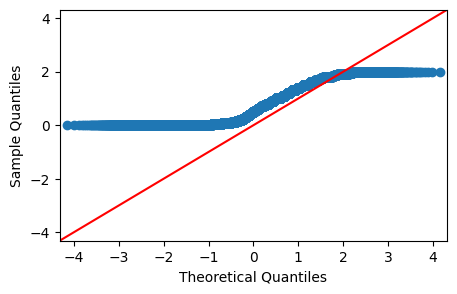

In [20]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,3)

# Check for normality with a QQ-plot
sm.qqplot(food_data[col_], line='45')
plt.show()

# Bivariate Analysis

## Correlations

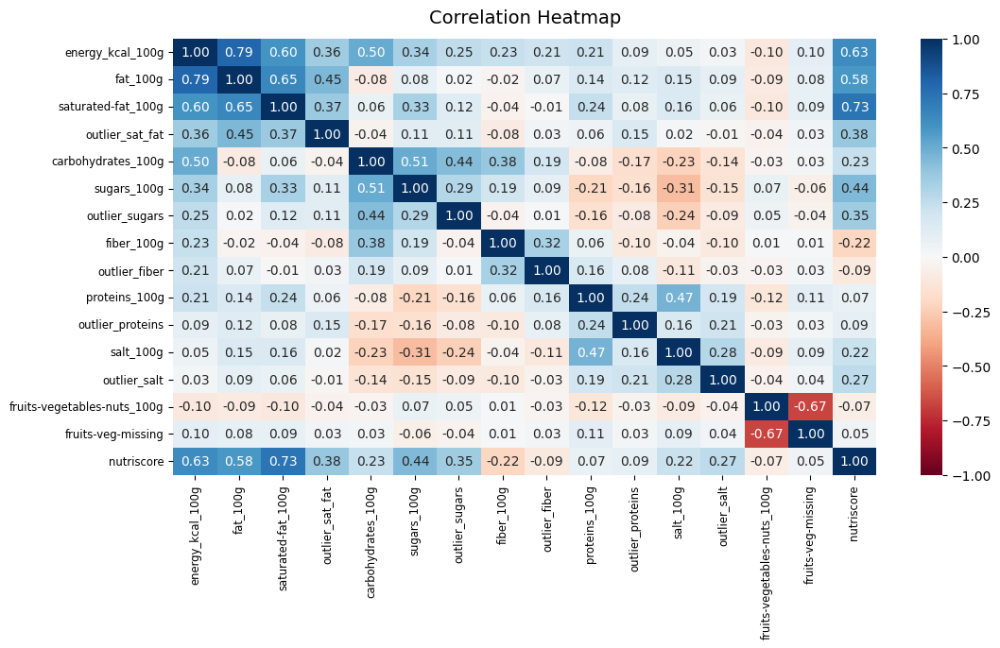

In [21]:
# List of available cmpa colors:
# https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html

# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (12,6)
# To reset figsize for future plots
#plt.rcParams['figure.figsize'] = plt.rcParamsDefault['figure.figsize']

# Select the numeric columns
num_df = food_data.select_dtypes(exclude='object')

# Create the plot
ax = sns.heatmap(num_df.corr(), vmin=-1, vmax=1, cmap='RdBu', annot=True,
                 fmt='.2f')
ax.tick_params(labelsize='small')
ax.set_title('Correlation Heatmap', fontdict={'fontsize':14}, pad=12)
plt.show()

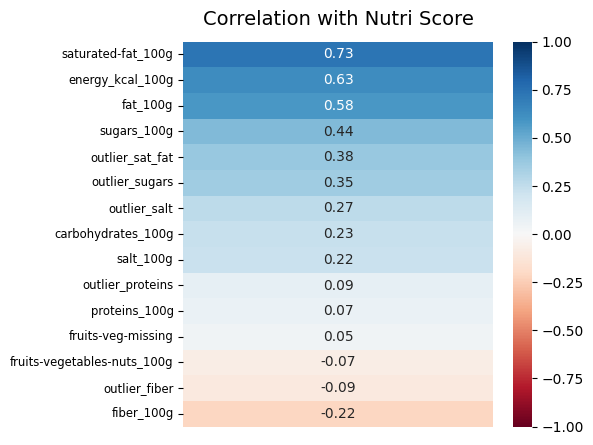

In [22]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (5,5)

# Let's plot the correlations with the Nutri Score
ax = sns.heatmap(
    num_df.corr()[['nutriscore']].drop(index=['nutriscore']).sort_values(
        by='nutriscore', ascending=False),
    vmin=-1, vmax=1, cmap='RdBu', annot=True, fmt='.2f', xticklabels=False)
ax.tick_params(labelsize='small')
ax.set_title('Correlation with Nutri Score', fontdict={'fontsize':14}, pad=12)
plt.show()

Let's recall that the Nutri Score is based on "points", the lower the better:
* A, which is the "best", ranges from -15 to -2,
* B ranges from -1 to 3,
* C ranges from 4 to 11,
* D ranges from 12 to 16,
* E, which is the "worst", ranges from 17 to 40.

With the correlations, this can seem intuitive that:
* The higher the fibers the lower the score (meaning "healthier"),
* And the higher the fat and the energy the higher the score (consumption should be limited).

## Dependency

In [23]:
# Define the list of columns to plot
cols_plot = ['energy_kcal_100g', 'fat_100g', 'saturated-fat_100g',
             'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g',
             'salt_100g', 'fruits-vegetables-nuts_100g', 'nutriscore']

# Define the "hue" (= subset for coloration)
hue_ = ['nutrigrade']

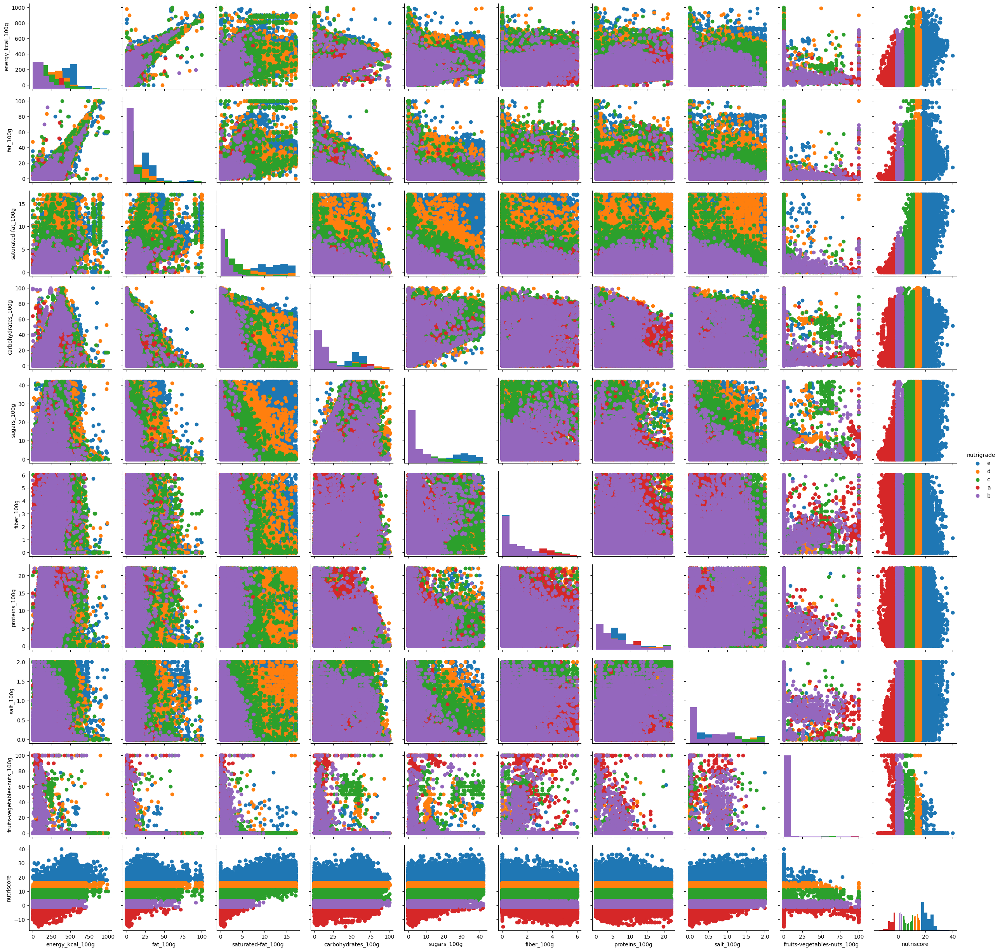

In [24]:
# That's quite a heavy graph, takes ~1 min to run

# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (12,6) # doesn't seem to be accounted for

# Select the subset for plotting
subset = food_data[cols_plot + hue_]

# Create the plot
graph = sns.PairGrid(subset, hue=hue_[0])
# Draw histograms on the diagonal
graph = graph.map_diag(plt.hist)
# Draw scatterplot off the diagonal
graph = graph.map_offdiag(plt.scatter)
# Add legends
graph = graph.add_legend()
plt.show()

There's no clear "trend" when comparing the variables (last row).

# Multivariate Analysis

In [25]:
# Import libraries to be used
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from matplotlib.collections import LineCollection
import plotly.express as px

In [26]:
# Define a helper function to represent the cirle of correlations
def display_circles(pcs, n_comp, pca, axis_ranks, labels=None, label_rotation=0,
                    lims=None):
    for d1, d2 in axis_ranks:
        if d2 < n_comp:

            # Define the dimension of the plot
            fig, ax = plt.subplots(figsize=(6,6))

            # Define the limits of the plot
            if lims is not None :
                xmin, xmax, ymin, ymax = lims
            elif pcs.shape[1] < 30 :
                xmin, xmax, ymin, ymax = -1, 1, -1, 1
            else :
                xmin, xmax = min(pcs[d1,:]), max(pcs[d1,:])
                ymin, ymax = min(pcs[d2,:]), max(pcs[d2,:])

            # Arrows:if more than 30, do not display the triangle at the edge
            if pcs.shape[1] < 30 :
                plt.quiver(np.zeros(pcs.shape[1]), np.zeros(pcs.shape[1]),
                           pcs[d1,:], pcs[d2,:],
                           angles='xy', scale_units='xy', scale=1, color="grey")
            # Cf. https://matplotlib.org/api/_as_gen/matplotlib.pyplot.quiver.html)
            else:
                lines = [[[0,0],[x,y]] for x,y in pcs[[d1,d2]].T]
                ax.add_collection(LineCollection(lines, axes=ax, alpha=.1,
                                                 color='black'))

            # Variables name
            if labels is not None:
                for i,(x, y) in enumerate(pcs[[d1,d2]].T):
                    if x >= xmin and x <= xmax and y >= ymin and y <= ymax :
                        plt.text(x, y, labels[i], fontsize='14', ha='center',
                                 va='center', rotation=label_rotation,
                                 color="blue", alpha=0.5)

            # Circle
            circle = plt.Circle((0,0), 1, facecolor='none', edgecolor='b')
            plt.gca().add_artist(circle)

            # Set the limits
            plt.xlim(xmin, xmax)
            plt.ylim(ymin, ymax)

            # Display x and y axis
            plt.plot([-1, 1], [0, 0], color='grey', ls='--')
            plt.plot([0, 0], [-1, 1], color='grey', ls='--')

            # Axes name, with explained %
            plt.xlabel('F{} ({}%)'.format(d1+1, round(
                100*pca.explained_variance_ratio_[d1],1)))
            plt.ylabel('F{} ({}%)'.format(d2+1, round(
                100*pca.explained_variance_ratio_[d2],1)))

            plt.title(f"Correlation circle (F{d1+1} and F{d2+1})")
            plt.show(block=False)

In [27]:
# Select the numeric columns
num_df = food_data.select_dtypes(exclude='object')

# Standardize the data
std_df = StandardScaler().fit_transform(num_df)

# Define the number of components to plot
n_comp_ = 6

# Create the PCA
pca = PCA(n_comp_)

# Fit on and transform the data
projected = pca.fit_transform(std_df)

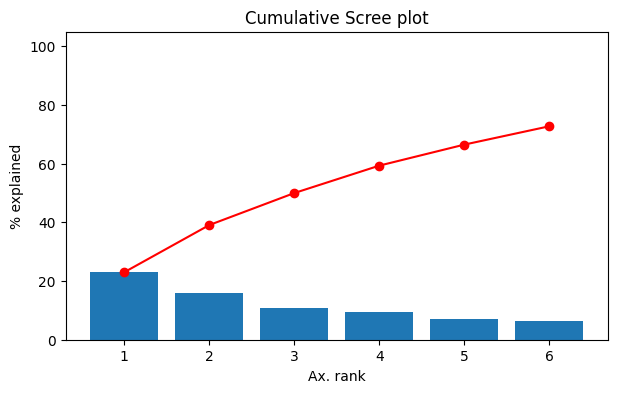

In [28]:
# Define the dimensions of the plot
plt.rcParams['figure.figsize'] = (7,4)

# Scree plot
pc_values = np.arange(pca.n_components_) + 1
plt.bar(pc_values, pca.explained_variance_ratio_*100)
plt.plot(pc_values, np.cumsum(pca.explained_variance_ratio_*100), 'ro-')
plt.title('Cumulative Scree plot')
plt.xlabel('Ax. rank')
plt.ylabel('% explained')
plt.ylim(0,105)
plt.show()

In [29]:
# Visualize the Principal Components, colored by Nutri Grade
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(projected,
                        labels=labels,
                        dimensions=range(n_comp_),
                        color=food_data['nutrigrade'],
                        width=1400,
                        height=1000
)
fig.update_traces(diagonal_visible=False)
fig.show()

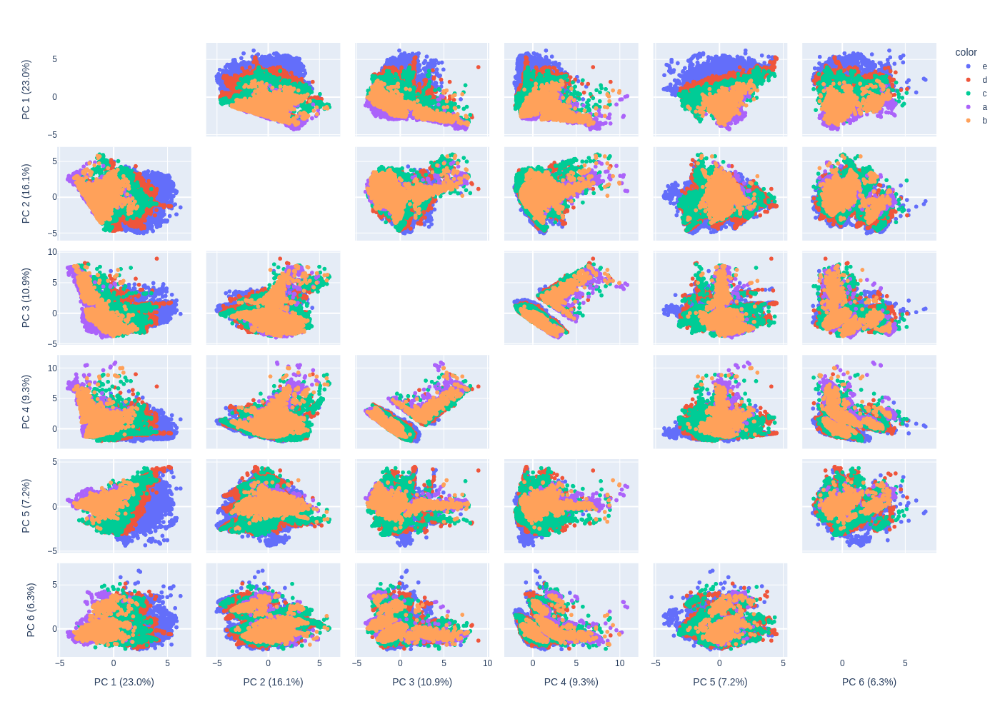

In [30]:
# Cf: https://plotly.com/python/static-image-export/

# Save it as a PNG
fig.write_image("PC_by_nutrigrade.png")

# Then display (for GitHub)
from IPython.display import Image

Image('PC_by_nutrigrade.png')

In [31]:
# Visualize the Principal Components, colored by Pnns group 1
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(projected,
                        labels=labels,
                        dimensions=range(n_comp_),
                        color=food_data['pnns_1'],
                        width=1400,
                        height=1000
)
fig.update_traces(diagonal_visible=False)
fig.show()

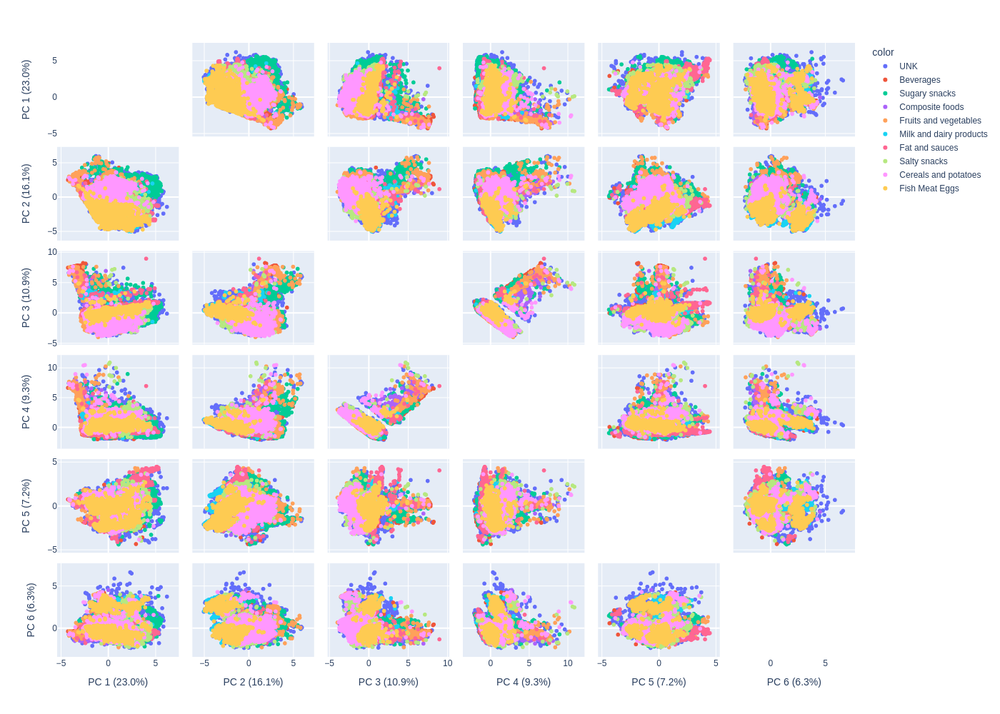

In [32]:
# Save it as a PNG
fig.write_image("PC_by_pnns1.png")

# Then display (for GitHub)
Image('PC_by_pnns1.png')

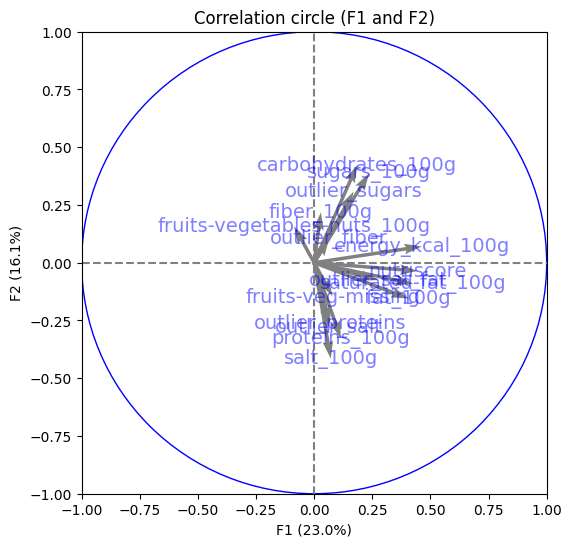

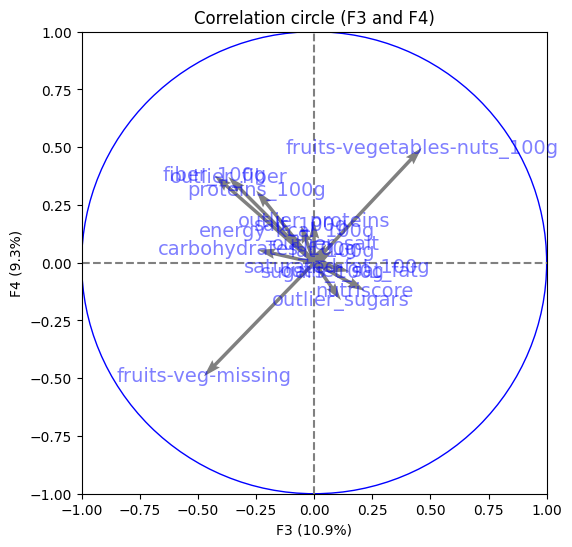

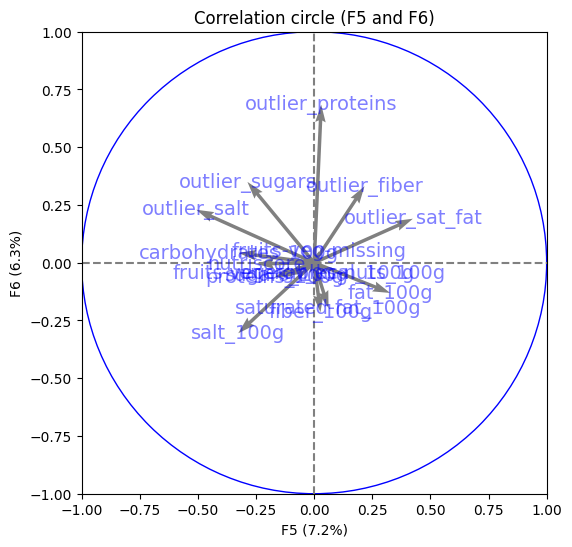

In [33]:
# Reset figsize for future plots
plt.rcParams['figure.figsize'] = plt.rcParamsDefault['figure.figsize']

# Plot the correlation circles for the 3 first plans
names = num_df.index
features = num_df.columns
pcs = pca.components_
display_circles(pcs, n_comp_, pca, [(0,1),(2,3),(4,5)],
                labels = np.array(features))
plt.show()